Plot clusters in spatial
Merge decomposed scRNA and real scRNA
Histogram of non-zero decomposition

In [1]:
import spotiphy
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
import importlib as imp
import spotiphy
import anndata as ad
import umap
imp.reload(spotiphy)

<module 'spotiphy' from 'C:\\Users\\zzheng92\\Desktop\\Spotiphy\\spotiphy\\__init__.py'>

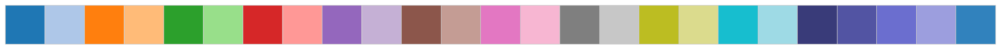

In [2]:
cmap1 = plt.get_cmap("tab20")
cmap2 = plt.get_cmap("tab20b")
cmap3 = plt.get_cmap("tab20c")
colors1 = cmap1.colors
colors2 = cmap2.colors
colors3 = cmap3.colors
contrast_palette = sns.color_palette(list(colors1) + list(colors2[:4]) + list(colors3[:1]))
del cmap1, cmap2, cmap3, colors1, colors2, colors3
sns.palplot(contrast_palette)

In [3]:
%%time
# adata_sc_files = ["F:/Ziqian Zheng/Spatial omics/Public dataset/scRNA/scRNA.h5ad",
#                   "F:/Ziqian Zheng/Spotiphy_data/SCRNA/sum_43plus_anno.h5ad",]
# adata_sc = sc.read_h5ad(adata_sc_files[1])
adata_st = sc.read_visium("F:/Ziqian Zheng/Spotiphy_data/ST/Sample221/outs")
# adata_st = sc.read_h5ad("F:/Ziqian Zheng/Spotiphy_data/Simulated ST/Simulated_ST_221_1.h5ad")
adata_st.var_names_make_unique()
results_folder = 'results/221_43plus/'
key_type = 'majortype'
cell_proportion = np.load(results_folder+'proportion.npy')

anndata.py (1832): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


CPU times: total: 1.67 s
Wall time: 1.78 s


In [4]:
%%time
# adata_st_decomposed = spotiphy.deconvolution.decomposition(adata_st, adata_sc, key_type, cell_proportion, save=True,
#                                out_dir=results_folder, threshold=0.1, spot_location=adata_st.obsm['spatial'])
adata_st_decomposed = sc.read_h5ad(results_folder+'ST_decomposition.h5ad')
adata_st_decomposed.uns['spatial'] = adata_st.uns['spatial']

CPU times: total: 281 ms
Wall time: 763 ms


In [5]:
adata_st_decomposed.obs['cell_type'].value_counts()

cell_type
GABAergic          3361
Microglia          2692
Macrophage         2208
DAM                 581
Neutrophil          295
TCell               280
Oligodendrocyte     260
Ependymal           203
Fibroblast          101
BCell                43
Glutamatergic        24
OPC                   4
RadialGlia            2
NSC                   1
Name: count, dtype: int64

In [6]:
cluster_df = pd.read_excel('results/221_43plus/meta.data.xlsx', header=0)
adata_st_decomposed.obs['seurat_clusters'] =  cluster_df['seurat_clusters'].values
seurat_clusters = adata_st_decomposed.obs.groupby('seurat_clusters')['cell_type'].value_counts().unstack().fillna(0)
# seurat_clusters.to_csv(results_folder+'seurat_cluster_purity.csv')

In [7]:
cluster_df = pd.read_csv('results/221_43plus/clustering_UMAP_euclidean_20_1.0.txt', header=0, delimiter='\t')
adata_st_decomposed.obs['mica_clusters'] =  cluster_df['label'].values
mica_clusters = adata_st_decomposed.obs.groupby('mica_clusters')['cell_type'].value_counts().unstack().fillna(0)
# mica_clusters.to_csv(results_folder+'mica_cluster_purity.csv')

In [16]:
cluster_df = pd.read_csv('results/221_43plus/clustering_UMAP_euclidean_20_1.2214.txt', header=0, delimiter='\t')
adata_st_decomposed.obs['mica_clusters_DAM'] = 0
adata_st_decomposed.obs.loc[adata_st_decomposed.obs['cell_type']=='DAM', 'mica_clusters_DAM'] = cluster_df['label'].values
adata_st_decomposed.obs['mica_clusters_DAM'] = ['cluster ' + str(i) for i in adata_st_decomposed.obs['mica_clusters_DAM']]

In [17]:
adata_st_decomposed.obs

,cell_type,location_x,location_y,seurat_clusters,mica_clusters,mica_clusters_DAM
0,BCell,5212,1929,30,1,cluster 0
1,BCell,7573,2313,1,1,cluster 0
2,BCell,7908,1334,30,1,cluster 0
3,BCell,4876,2321,30,1,cluster 0
4,BCell,2134,6535,17,1,cluster 0
...,...,...,...,...,...,...
10050,TCell,2976,6239,17,1,cluster 0
10051,TCell,3255,5358,5,1,cluster 0
10052,TCell,3201,6238,17,1,cluster 0
10053,TCell,3990,7018,5,1,cluster 0


In [ ]:
adata_st_decomposed.obsm['spatial'] = adata_st_decomposed.obs[['location_x', 'location_y']].values
with mpl.rc_context({'figure.figsize': [7, 7], 'figure.dpi': 400}):
    cluster_column = 'mica_clusters_DAM'
    for i in adata_st_decomposed.obs[cluster_column].unique():
        adata_st_decomposed.obs['temp'] = (adata_st_decomposed.obs[cluster_column].values==i).astype(np.int32)
        ax = sc.pl.spatial(adata_st_decomposed, color='temp', img_key='hires', size=1.3, show=False, title=str(i))
        ax[0].get_figure().savefig(results_folder+'Cluster location/MICA_DAM/'+str(i)+'.jpg')

_utils.py (430): Trying to modify attribute `._uns` of view, initializing view as actual.


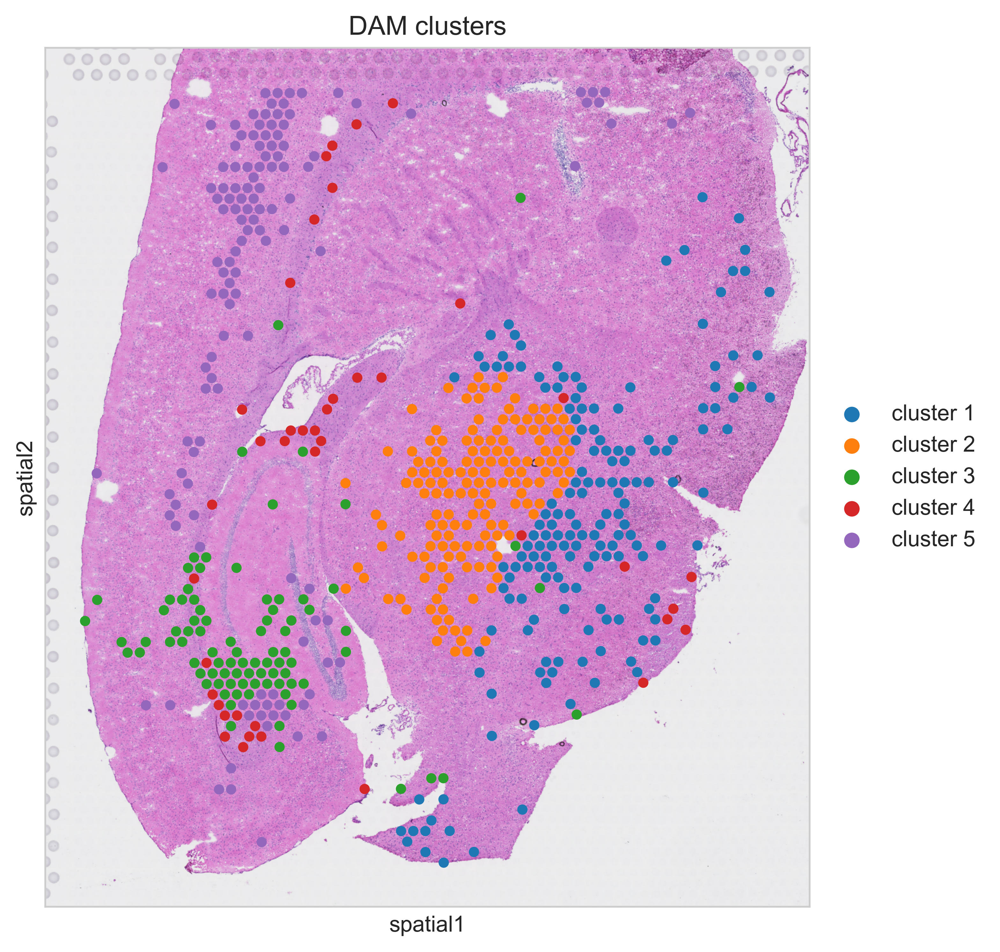

In [28]:
adata_st_decomposed.obsm['spatial'] = adata_st_decomposed.obs[['location_x', 'location_y']].values
with mpl.rc_context({'figure.figsize': [7, 7], 'figure.dpi': 500}):
    ax = sc.pl.spatial(adata_st_decomposed[adata_st_decomposed.obs['mica_clusters_DAM'].values!='cluster 0'], color='mica_clusters_DAM', img_key='hires', size=1.3, show=False, title='DAM clusters')
    ax[0].get_figure().savefig(results_folder+'Cluster location/DAM.jpg', bbox_inches='tight')

In [21]:
X = adata_st_decomposed.X
X = X/np.sum(X, axis=1, keepdims=True) * 10**6
X_nonzero = X[X>0]

(array([19053377.,  8737568.,  3522727.,  1786054.,  1068171.,   704712.,
          496581.,   368206.,   283048.,   221743.]),
 array([2.94138088e-02, 1.00026456e+02, 2.00023497e+02, 3.00020539e+02,
        4.00017581e+02, 5.00014623e+02, 6.00011665e+02, 7.00008707e+02,
        8.00005749e+02, 9.00002790e+02, 9.99999832e+02]),
 <BarContainer object of 10 artists>)

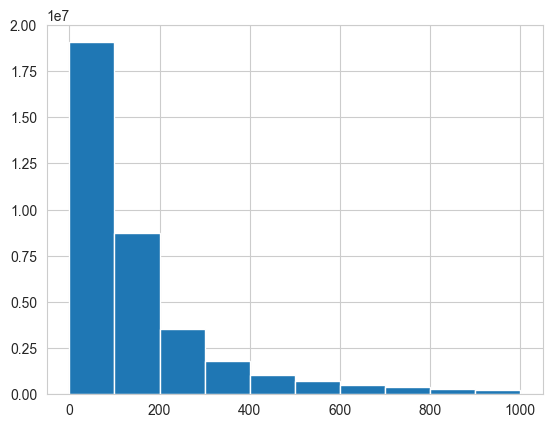

In [33]:
plt.hist(X_nonzero[X_nonzero<1000])

In [27]:
X[X<1000] = 0
adata_st_decomposed.X = X
adata_st_decomposed.write(results_folder+'ST_decomposition_filter1000.h5ad')

In [7]:
n_decompose = len(adata_st_decomposed)
n_sc = len(adata_sc)
adata_merge = ad.concat([adata_sc, adata_sc[:n_decompose]])
adata_merge.obs_names = list(adata_sc.obs_names) + [str(i) for i in range(n_decompose)]

anndata.py (1830): Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [10]:
adata_merge.obs.iloc[n_sc:] = 0
adata_merge.obs.iloc[n_sc:, adata_merge.obs.columns.get_loc('orig.ident')] = 'spatial'
adata_merge.obs.iloc[n_sc:, adata_merge.obs.columns.get_loc('majortype')] = adata_st_decomposed.obs['cell_type']
adata_merge.obs.iloc[n_sc:, adata_merge.obs.columns.get_loc('decon')] = adata_st_decomposed.obs['cell_type']
adata_merge.obs.iloc[n_sc:, adata_merge.obs.columns.get_loc('doublet_finder')] = '0'
adata_merge.obs.iloc[n_sc:, adata_merge.obs.columns.get_loc('CellName')] = '0'

In [11]:
adata_merge.obs[n_sc-10:n_sc+10]

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,age,gender,genotype,group,RNA_snn_res.0.5,seurat_clusters,...,CellName,nUMI.total,nGene,percent.mito,percent.spikeIn,X,Y,ClusterRes,majortype,decon
NCF64_TTTGTCTAGCGATAGA-1,NCF64,4288.0,2371,4.244403,2,1,1,5,15,15,...,NCF64,4288.0,2371,4.244403,0.0,5.282765,16.559023,12,GABAergic,GABAergic
NCF64_TTTGTCTAGGAACGGT-1,NCF64,2843.0,1400,2.638058,2,1,1,5,23,23,...,NCF64,2843.0,1400,2.638058,0.0,12.450172,-4.774952,21,TCell,Treg
NCF64_TTTGTGAAGGTCCGTA-1,NCF64,2552.0,1469,0.862069,2,1,1,5,5,5,...,NCF64,2552.0,1469,0.862069,0.0,7.005984,-7.391496,9,TCell,CD8T_Exhausted
NCF64_TTTGTGGCAACGTGCT-1,NCF64,4868.0,2211,2.773213,2,1,1,5,1,1,...,NCF64,4868.0,2211,2.773213,0.0,11.451719,7.349648,30,Microglia,Microglia
NCF64_TTTGTGGCATTGTGTG-1,NCF64,8152.0,2768,7.323356,2,1,1,5,2,2,...,NCF64,8152.0,2768,7.323356,0.0,9.051647,5.708003,2,DAM,DAM
NCF64_TTTGTGTTCAAATCGC-1,NCF64,12905.0,4108,2.502906,2,1,1,5,4,4,...,NCF64,12905.0,4108,2.502906,0.0,-1.287357,1.356972,19,Astrocyte,Astrocyte
NCF64_TTTGTGTTCATTACTC-1,NCF64,14723.0,4368,5.909122,2,1,1,5,3,3,...,NCF64,14723.0,4368,5.909122,0.0,-4.494774,8.605721,4,Oligodendrocyte,Oligodendrocyte
NCF64_TTTGTGTTCCAGGTTG-1,NCF64,13058.0,4104,0.673916,2,1,1,5,25,25,...,NCF64,13058.0,4104,0.673916,0.0,-1.245576,10.470936,20,OPC,OPC
NCF64_TTTGTGTTCCTTGTTG-1,NCF64,7731.0,3296,1.164144,2,1,1,5,26,26,...,NCF64,7731.0,3296,1.164144,0.0,6.957877,1.752488,15,Ependymal,Ependymal
NCF64_TTTGTTGGTTGCAGTA-1,NCF64,8089.0,2902,4.969712,2,1,1,5,1,1,...,NCF64,8089.0,2902,4.969712,0.0,12.078207,5.996086,30,Microglia,Microglia


In [12]:
adata_merge = adata_merge[:, adata_st_decomposed.var_names]
adata_sc = adata_sc[:, adata_st_decomposed.var_names]
X1 = adata_sc.X.toarray()
X2 = adata_st_decomposed.X

In [14]:
X = np.vstack((X1, X2))
del X1, X2
adata_merge.X = X
del X

In [15]:
adata_merge.write(results_folder+'adata_merge.h5ad')

anndata.py (1222): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1222): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1222): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1222): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1222): Trying to modify attribute `.obs` of view, initializing view as actual.
